In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%env DATA=./gdrive/MyDrive/master-thesis

env: DATA=./gdrive/MyDrive/master-thesis


## Loading datasets

### Download datasets and store them inside Drive

In [ ]:
# Create data folder
! mkdir -p $DATA

In [ ]:
%%shell

# Download Kather16 training/test data
wget -O Kather_texture_2016_image_tiles_5000.zip https://zenodo.org/record/53169/files/Kather_texture_2016_image_tiles_5000.zip?download=1
mv Kather_texture_2016_image_tiles_5000.zip $DATA/.

--2024-04-03 10:22:05--  https://zenodo.org/record/53169/files/Kather_texture_2016_image_tiles_5000.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.184.98.238, 188.184.103.159, 188.185.79.172, ...
Connecting to zenodo.org (zenodo.org)|188.184.98.238|:443... connected.
HTTP request sent, awaiting response... 301 MOVED PERMANENTLY
Location: /records/53169/files/Kather_texture_2016_image_tiles_5000.zip [following]
--2024-04-03 10:22:05--  https://zenodo.org/records/53169/files/Kather_texture_2016_image_tiles_5000.zip
Reusing existing connection to zenodo.org:443.
HTTP request sent, awaiting response... 200 OK
Length: 258098431 (246M) [application/octet-stream]
Saving to: ‘Kather_texture_2016_image_tiles_5000.zip’

Kather_texture_2016 100%[===================>] 246.14M  19.8MB/s    in 13s     

2024-04-03 10:22:19 (18.4 MB/s) - ‘Kather_texture_2016_image_tiles_5000.zip’ saved [258098431/258098431]



In [ ]:
%%shell

# Download Kather16 training/test data
wget -O Kather_texture_2016_larger_images_10.zip https://zenodo.org/record/53169/files/Kather_texture_2016_larger_images_10.zip?download=1
mv Kather_texture_2016_larger_images_10.zip $DATA/.

# 707 MB

In [ ]:
%%shell

# Download Kather19 training data
wget -O NCT-CRC-HE-100K.zip https://zenodo.org/record/1214456/files/NCT-CRC-HE-100K.zip?download=1
mv NCT-CRC-HE-100K.zip $DATA/.

# cca 10 min

In [ ]:
%%shell

# Download Kather19 training data
wget -O CRC-VAL-HE-7K.zip https://zenodo.org/records/1214456/files/CRC-VAL-HE-7K.zip?download=1
mv CRC-VAL-HE-7K.zip $DATA/.

--2024-02-18 22:07:30--  https://zenodo.org/records/1214456/files/CRC-VAL-HE-7K.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.185.79.172, 188.184.103.159, 188.184.98.238, ...
Connecting to zenodo.org (zenodo.org)|188.185.79.172|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 800276929 (763M) [application/octet-stream]
Saving to: ‘CRC-VAL-HE-7K.zip’

CRC-VAL-HE-7K.zip   100%[===================>] 763.20M  25.6MB/s    in 32s     

2024-02-18 22:08:03 (24.1 MB/s) - ‘CRC-VAL-HE-7K.zip’ saved [800276929/800276929]



### Load datasets from Drive

In [ ]:
! rm -rf data

In [ ]:
! mkdir -p data

In [ ]:
! cp $DATA/Kather_texture_2016_image_tiles_5000.zip data

In [ ]:
! unzip data/Kather_texture_2016_image_tiles_5000.zip -d data && rm data/Kather_texture_2016_image_tiles_5000.zip

In [ ]:
! cp $DATA/Kather_texture_2016_image_tiles_5000_NORM.zip data

In [ ]:
! mkdir data/Kather_texture_2016_image_tiles_5000_NORM

In [ ]:
! unzip data/Kather_texture_2016_image_tiles_5000_NORM.zip -d data/Kather_texture_2016_image_tiles_5000_NORM && rm data/Kather_texture_2016_image_tiles_5000_NORM.zip

In [ ]:
! cp $DATA/Kather_texture_2016_larger_images_10.zip data

In [ ]:
! unzip data/Kather_texture_2016_larger_images_10.zip -d data/. && rm data/Kather_texture_2016_larger_images_10.zip

unzip:  cannot find or open data/Kather_texture_2016_larger_images_10.zip, data/Kather_texture_2016_larger_images_10.zip.zip or data/Kather_texture_2016_larger_images_10.zip.ZIP.


In [ ]:
! cp $DATA/NCT-CRC-HE-100K.zip data

# cca 2 min

cp: cannot stat './gdrive/MyDrive/master-thesis/NCT-CRC-HE-100K.zip': No such file or directory


In [ ]:
! unzip data/NCT-CRC-HE-100K.zip -d data/. && rm data/NCT-CRC-HE-100K.zip

# cca 4~5 min

In [ ]:
! cp $DATA/CRC-VAL-HE-7K.zip data

In [ ]:
! unzip data/CRC-VAL-HE-7K.zip -d data/. && rm data/CRC-VAL-HE-7K.zip

## Visualisation code

In [ ]:
from random import randrange

import os
from os import listdir
from os.path import isfile, join

import numpy as np

from osgeo import gdal
import matplotlib.pyplot as plt

In [ ]:
def get_image_paths(base_path):
  return [ f'{base_path}/{f}' for f in listdir(base_path) if isfile(join(base_path, f))]

In [ ]:
def load_image(path):

  dataset = gdal.Open(path)

  # since there are 3 bands
  # we store in 3 different variables
  band1 = dataset.GetRasterBand(1) # Red channel
  band2 = dataset.GetRasterBand(2) # Green channel
  band3 = dataset.GetRasterBand(3) # Blue channel

  b1 = band1.ReadAsArray()
  b2 = band2.ReadAsArray()
  b3 = band3.ReadAsArray()
  img = np.dstack((b1, b2, b3))

  return img

In [ ]:
def numberOfImages(classes,base_path):
  print(f'{"Class":<24} | Images')
  print(f'-------------------------------------')

  total = 0

  for i,img_class in enumerate(classes):
    onlyfiles = get_image_paths(f'{base_path}/{img_class["dir"]}')

    print(f'{img_class["name"]:<24} | {len(onlyfiles)}')
    total+=len(onlyfiles)

  print(f'-------------------------------------')

  print(f'{"TOTAL":<24} | {total}')

In [ ]:
def printImages(classes,base_path,number_of_images=5, im_height=16, figsize=(10, 16)):
  fig, axs = plt.subplots(len(classes), number_of_images, figsize=figsize)

  for i,img_class in enumerate(classes):
    onlyfiles = get_image_paths(f'{base_path}/{img_class["dir"]}')
    for j in range(number_of_images):
      img = load_image(onlyfiles[randrange(len(onlyfiles))])
      axs[i, j].imshow(img)

      axs[i, j].set_xlabel(j + 1, fontsize="x-large")
      axs[i, j].set_ylabel(img_class["name"], rotation=0, fontsize="x-large", horizontalalignment="right", wrap=True, verticalalignment="center")


      axs[i, j].label_outer()
      # hide the axis labels
      axs[i, j].xaxis.set_tick_params(labelbottom=False)
      axs[i, j].yaxis.set_tick_params(labelleft=False)

      # Hide X and Y axes tick marks
      axs[i, j].set_xticks([])
      axs[i, j].set_yticks([])
  fig.tight_layout()

In [ ]:
# Image is afterward edited in MS Paint to create the gap between columns!
def printImagesTwoDatasetComparison(classes,base_path_1,base_path_2,number_of_images=3, figsize=(10, 15)):
  fig, axs = plt.subplots(len(classes), number_of_images*2, figsize=figsize)

  for i,img_class in enumerate(classes):
    onlyfiles_1 = get_image_paths(f'{base_path_1}/{img_class["dir"]}')
    onlyfiles_2 = get_image_paths(f'{base_path_2}/{img_class["dir"]}')

    for j in range(0,(number_of_images*2)-1,2):

      image_index = randrange(len(onlyfiles_1))
      img_1 = load_image(onlyfiles_1[image_index])
      img_2 = load_image(onlyfiles_2[image_index])


      axs[i, j].imshow(img_1)
      axs[i, j].set_xlabel(f"Original {j//2+1}", fontsize="x-large")
      axs[i, j].set_ylabel(img_class["name"], rotation=0, fontsize="x-large", horizontalalignment="right", wrap=True, verticalalignment="center")

      axs[i, j].label_outer()
      # hide the axis labels
      axs[i, j].xaxis.set_tick_params(labelbottom=False)
      axs[i, j].yaxis.set_tick_params(labelleft=False)

      # Hide X and Y axes tick marks
      axs[i, j].set_xticks([])
      axs[i, j].set_yticks([])


      axs[i, j+1].imshow(img_2)
      axs[i, j+1].set_xlabel(f"Normalized {j//2+1}", fontsize="x-large")
      axs[i, j+1].set_ylabel(img_class["name"], rotation=0, fontsize="x-large", horizontalalignment="right", wrap=True, verticalalignment="center")

      axs[i, j+1].label_outer()
      # hide the axis labels
      axs[i, j+1].xaxis.set_tick_params(labelbottom=False)
      axs[i, j+1].yaxis.set_tick_params(labelleft=False)

      # Hide X and Y axes tick marks
      axs[i, j+1].set_xticks([])
      axs[i, j+1].set_yticks([])
  fig.tight_layout()

# Kather16

Tumour Epithelium:
  - Description: Tumor epithelium refers to the cancerous cells that originate from the epithelial tissue lining the colon or rectum.
  - Role: These cells are the primary constituents of the tumor and are responsible for the malignancy associated with colorectal cancer.

Simple Stroma (Homogeneous Composition):
  - Description: Simple stroma consists of connective tissue elements, including fibroblasts and extracellular matrix, and may include smooth muscle.
  - Role: Provides structural support to the tumor and influences its behavior. The homogeneous composition implies a relatively uniform structure.

Complex Stroma (Containing Single Tumor Cells and/or Few Immune Cells):
  - Description: Complex stroma is characterized by a more varied composition, including individual tumor cells and a limited number of immune cells.
  - Role: This type of stroma suggests a more dynamic and interactive microenvironment, possibly influencing tumor growth and response to treatment.

Immune Cells (Including Immune-Cell Conglomerates and Sub-Mucosal Lymphoid Follicles):
  - Description: Immune cells refer to various cells of the immune system, such as lymphocytes, macrophages, and dendritic cells.
  - Role: The presence of immune cells in the tumor microenvironment is indicative of the host's immune response. Immune-cell conglomerates and lymphoid follicles suggest organized immune reactions within the tumor.

Debris (Including Necrosis, Hemorrhage, and Mucus):
  - Description: Debris encompasses non-living material within the tumor, such as dead cells (necrosis), blood (hemorrhage), and mucus.
  - Role: Indicates areas of tissue damage and may affect the local microenvironment. Necrosis may result from rapid tumor growth, leading to insufficient blood supply.

Normal Mucosal Glands:
  - Description: Normal mucosal glands are remnants of the normal tissue structure in the colon or rectum.
  - Role: The presence of normal mucosal glands within the tumor indicates the disruption of the normal tissue architecture due to the invasive growth of cancer cells.

Adipose Tissue:
  - Description: Adipose tissue refers to fat cells present in the tumor microenvironment.
  - Role: Adipose tissue infiltration is associated with more advanced stages of colorectal cancer. It may contribute to the aggressiveness of the tumor and affect the prognosis.
  

### Visualisation

In [ ]:
classes_k16 = [
    {
        "name": "Adipose",
        "dir": "07_ADIPOSE"
    },
    {
        "name": "Mucosa",
        "dir": "06_MUCOSA"
    },
    {
        "name": "Stroma",
        "dir": "02_STROMA"
    },
    {
       "name": "Tumor",
       "dir": "01_TUMOR"
    },
    {
        "name": "Lympho",
        "dir": "04_LYMPHO"
    },
    {
        "name": "Complex",
        "dir": "03_COMPLEX"
    },
    {
        "name": "Debris",
        "dir": "05_DEBRIS"
    },
    {
        "name": "Empty",
        "dir": "08_EMPTY"
    }
]

base_path = "data"+"/Kather_texture_2016_image_tiles_5000"



In [ ]:
numberOfImages(classes_k16,base_path)

Class                    | Images
-------------------------------------
Adipose                  | 625
Mucosa                   | 625
Stroma                   | 625
Tumor                    | 625
Lympho                   | 625
Complex                  | 625
Debris                   | 625
Empty                    | 625
-------------------------------------
TOTAL                    | 5000


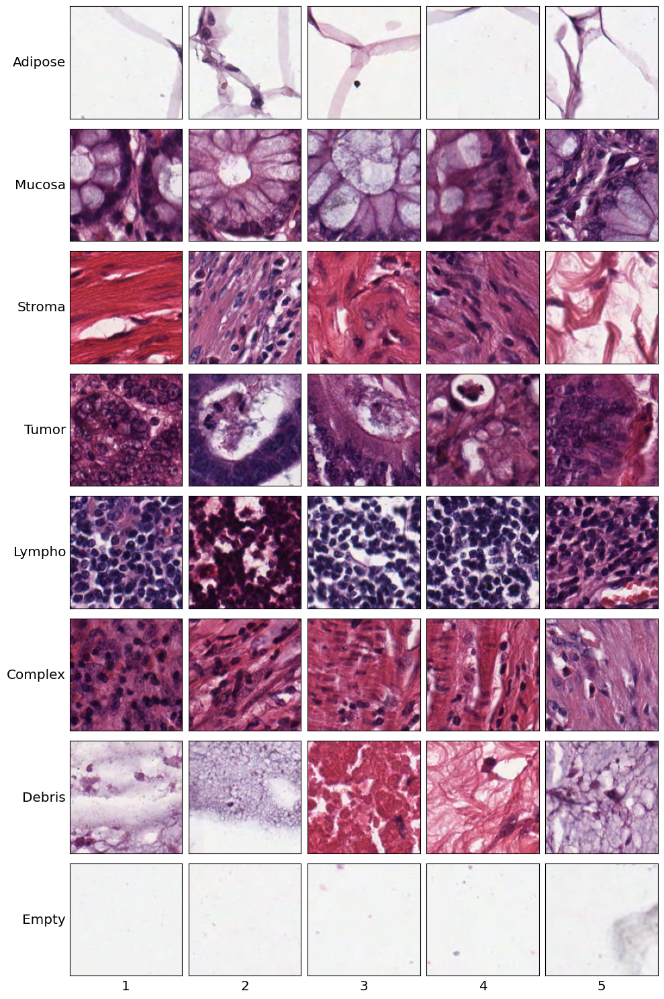

In [ ]:
printImages(classes_k16,base_path, figsize=(10, 15))

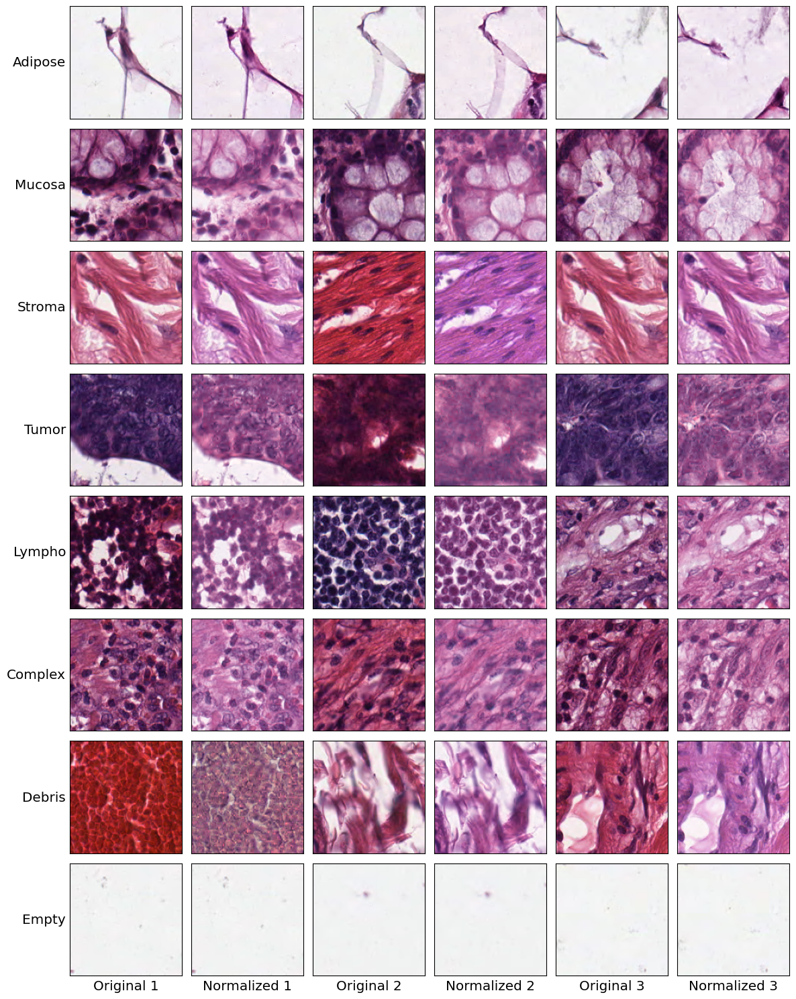

In [ ]:
base_path_2 = "data"+"/Kather_texture_2016_image_tiles_5000_NORM"
printImagesTwoDatasetComparison(classes_k16,base_path,base_path_2, figsize=(12, 15))

# Kather19

- 11.7 GB (36 min)
- images, 224 × 224 pixels (px) and 0.5 μm/px
- normalized with the Macenko method
- 86 HE slides of human cancer tissue -> training image set of 100,000 image patches
- 25 HE slides of human CRC tissue -> testing set of 7,180 image patches
- 862 HE slides from 500 CRC patients
- 409 HE slides from 409 patients

- 9 tissue classes:
  - a) adipose tissue
  - b) background
  - c) debris
  - d) lymphocytes
  - e) mucus
  - f) smooth muscle
  - g) normal colon mucosa
  - h) cancer-associated stroma
  - i) CRC epithelium

- several models tested, VGG19 best and used

### Visualisation 100k

In [ ]:
classes_k19 = [
    {
        "name": "Adipose tissue",
        "dir": "ADI"
    },
    {
        "name": "Mucus",
        "dir": "MUC"
    },
    {
        "name": "Smooth muscle",
        "dir": "MUS"
    },
    {
        "name": "Cancer-associated stroma",
        "dir": "STR"
    },
    {
        "name": "CRC epithelium",
        "dir": "TUM"
    },
    {
        "name": "Normal colon mucosa",
        "dir": "NORM"
    },
    {
        "name": "Lymphocytes",
        "dir": "LYM"
    },
    {
        "name": "Debris",
        "dir": "DEB"
    },
    {
        "name": "Background",
        "dir": "BACK"
    }
]

base_path_k19 = "data"+"/NCT-CRC-HE-100K"

number_of_images=10

In [ ]:
numberOfImages(classes_k19,base_path_k19)

Class                    | Images
-------------------------------------
Adipose tissue           | 10407
Mucus                    | 8896
Smooth muscle            | 13536
Cancer-associated stroma | 10446
CRC epithelium           | 14317
Normal colon mucosa      | 8763
Lymphocytes              | 11557
Debris                   | 11512
Background               | 10566
-------------------------------------
TOTAL                    | 100000


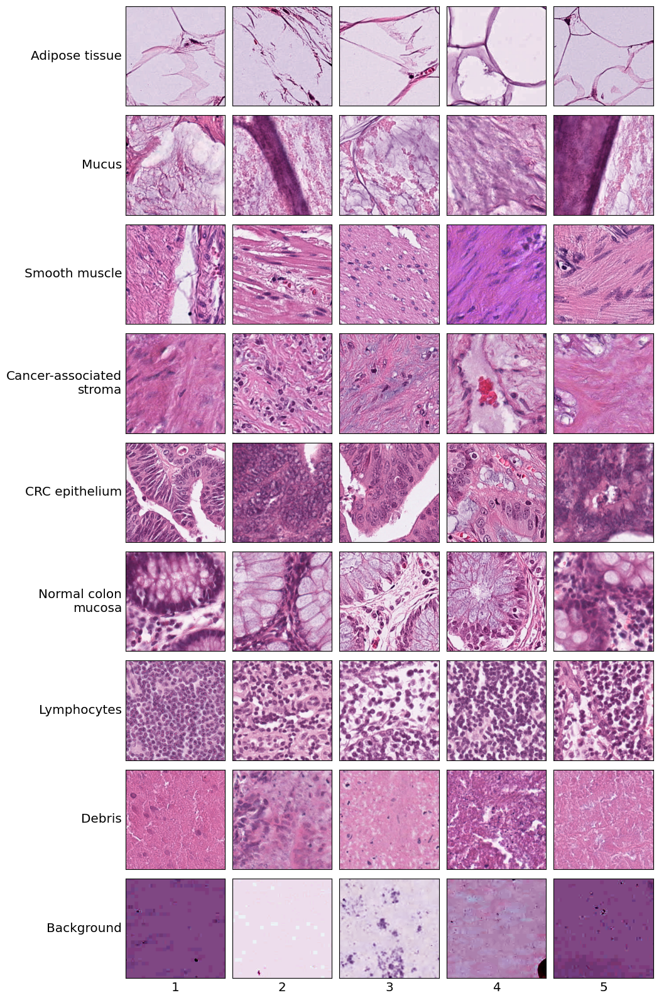

In [ ]:
printImages(classes_k19,base_path_k19, figsize=(10.7, 16))

### Visualisation 7k

In [ ]:
classes_k19_7k = [
    {
        "name": "Adipose tissue",
        "dir": "ADI"
    },
    {
        "name": "Mucus",
        "dir": "MUC"
    },
    {
        "name": "Smooth muscle",
        "dir": "MUS"
    },
    {
        "name": "Cancer-associated stroma",
        "dir": "STR"
    },
    {
        "name": "CRC epithelium",
        "dir": "TUM"
    },
    {
        "name": "Normal colon mucosa",
        "dir": "NORM"
    },
    {
        "name": "Lymphocytes",
        "dir": "LYM"
    },
    {
        "name": "Debris",
        "dir": "DEB"
    },
    {
        "name": "Background",
        "dir": "BACK"
    }
]

base_path_7k = "data"+"/CRC-VAL-HE-7K"

number_of_images=10

In [ ]:
numberOfImages(classes_k19_7k,base_path_7k)

Class                    | Images
-------------------------------------
Adipose tissue           | 1338
Mucus                    | 1035
Smooth muscle            | 592
Cancer-associated stroma | 421
CRC epithelium           | 1233
Normal colon mucosa      | 741
Lymphocytes              | 634
Debris                   | 339
Background               | 847
-------------------------------------
TOTAL                    | 7180


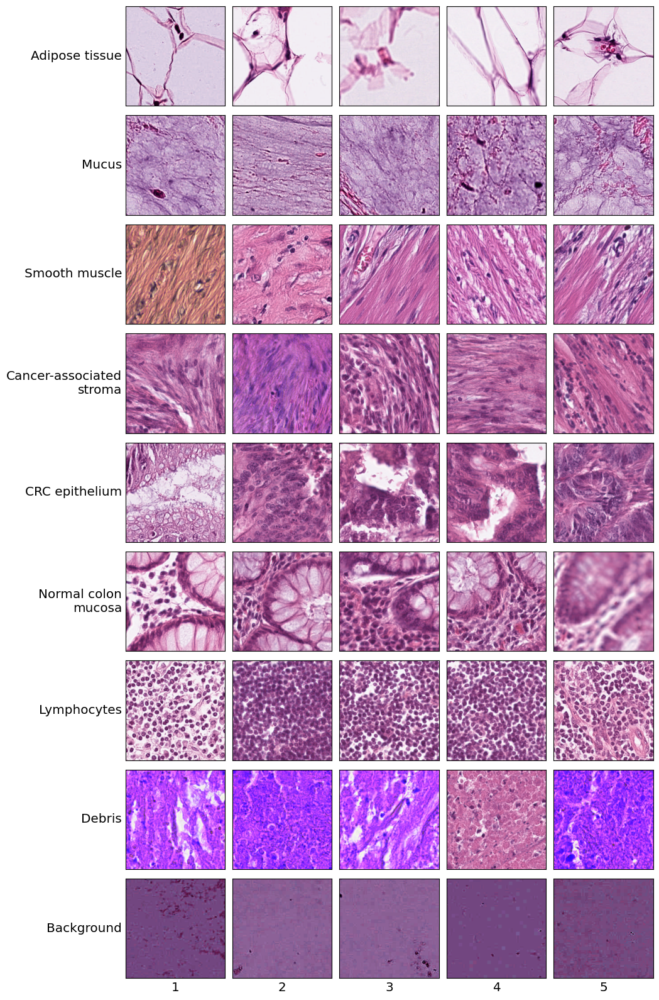

In [ ]:
printImages(classes_k19_7k,base_path_7k, figsize=(10.7, 16))
plt.show()